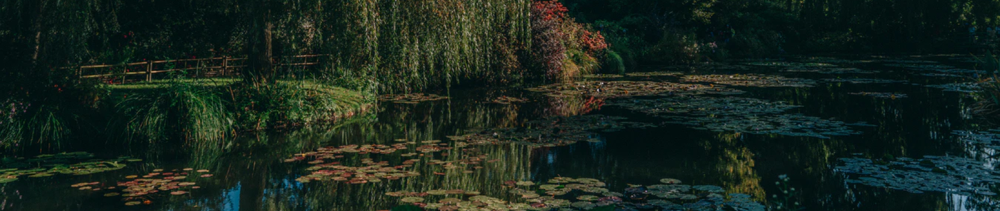

# CycleGAN - MONET PAINTINGS

What is CycleGAN?

"Image-to-image translation is a class of vision and graphics problems where the goal is to learn the mapping between an input image and an output image using a training set of aligned image pairs. However, for many tasks, paired training data will not be available. We present an approach for learning to translate an image from a source domain X to a target domain Yin the absence of paired examples. Our goal is to learn a mapping G: X -> Y, such that the distribution of images from G(X) is indistinguishable from the distribution Y using an adversarial loss. Because this mapping is highly under-constrained, we couple it with an inverse mapping F: Y -> X and introduce a cycle consistency loss to push F(G(X)) ~ X (and vice versa)." (Jun-Yan Zhu, Taesung Park, Phillip Isola and Alexei A. Efros, (2020), "Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks").

In essence it maps and image to a given domain, so for example if you are turning horses into zebras the image will be the horse and the domain is the zebra, or in the case of this project, we want to turn photographic images into Claude Monet paintings. Some examples from the research paper can be seen in the images below.

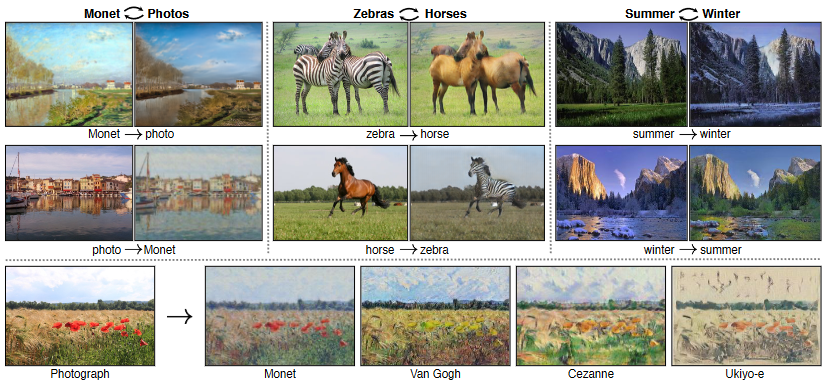

Some further examples from paintings turned into photographic images.

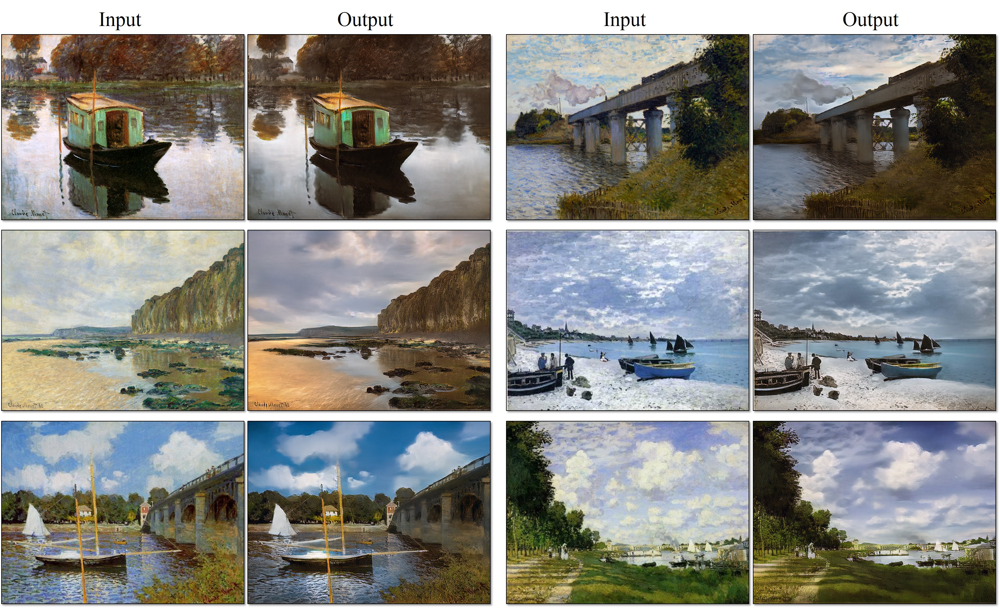

The CycleGAN model compromises of 4 parts that work in a cycle:
    
    - A Generator that learns to generate Monet paintings from landscape images
    - A Discriminator that learns to identify Monet paintings
    - A Generator that learns to generate landscape images from Monet paintings
    - A Discriminator that learns to identify landscape images

The idea is to learn to capture the special characteristics of the Monet paintings and figure out
how these characteristics could be translated into the landscape images, all in the absence
of any paired training examples, i.e. image-to-image translation.

This happens through the exploitation of the property that translation should be "cycle consistent",
in the sense that if for ex. we translate a sentence from English to French, and then translate it
back from French to English, we should arrive back at the original sentence. Mathematically, if we
have a translator $G : X -> Y$ and another translator $F : Y -> X$, then $G$ and $F$ should be inverses of
each other, and both mappings should be bijections.

This structural assumption is applied by training both the mapping G and F simultanously, and adding
a cycle consistency loss that encourages $F(G(x)))$ ~ $x$ and $G(F(y))$ ~ $y$. Combining this loss with
adversarial losses on domains X and Y, that force the generated paintings to be, in principle,
indistinguishable from real paintings, yields the full objective for unpaired image-to-image translation.

We will implement two different CycleGAN models. One that follows more closely the one introduced in the research paper and a second which will try to outperform the first model. We will use the Fréchet Inception Distance (FID Score) and of course the generated paintings themselves, to evaluate how the two models perform.

In [27]:
# Importing relevant modules

import re, glob

# TensorFlow for modeling
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import Callback
import tensorflow_addons as tfa

# Matrix manipulations and visualizations
import matplotlib.pyplot as plt
import numpy as np


# Setting up TPU usage
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Device:', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except:
    strategy = tf.distribute.get_strategy()
print('Number of replicas:', strategy.num_replicas_in_sync)

AUTOTUNE = tf.data.experimental.AUTOTUNE
    
print(tf.__version__)

Number of replicas: 1
2.7.0


## Creating the Dataset

In [3]:
# Setting up tools for image handling

IMAGE_SIZE = [256, 256]

def normalize_img(img):
    img = tf.cast(img, dtype=tf.float32)
    
    return (img / 127.5) - 1.0

def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    
    return image

def read_tfrecord(example):
    tfrecord_format = {
        "image": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

def load_dataset(filenames):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTOTUNE)
    return dataset

def display_samples(ds, row, col):
    ds_iter = iter(ds)
    plt.figure(figsize=(15, int(15*row/col)))
    for j in range(row*col):
        example_sample = next(ds_iter)
        plt.subplot(row,col,j+1)
        plt.axis('off')
        plt.imshow(example_sample[0] * 0.5 + 0.5)
    plt.show()

In [4]:
# Loading files

MONET_FILENAMES = tf.io.gfile.glob(str('./monet_tfrec/*.tfrec'))
PHOTO_FILENAMES = tf.io.gfile.glob(str('./photo_tfrec/*.tfrec'))
monet_ds = load_dataset(MONET_FILENAMES).batch(1)
photo_ds = load_dataset(PHOTO_FILENAMES).batch(1)

def count_data_items(filenames):
    n = [int(re.compile(r"-([0-9]*)\.").search(filename).group(1)) for filename in filenames]
    return np.sum(n)

n_monet_samples = count_data_items(MONET_FILENAMES)
n_photo_samples = count_data_items(PHOTO_FILENAMES)

print(f'Monet image files: {n_monet_samples}')
print(f'Photo image files: {n_photo_samples}')
print('This will give {} sets of 32 file batches'.format(n_monet_samples//32))

Monet image files: 1072
Photo image files: 7038
This will give 33 sets of 32 file batches


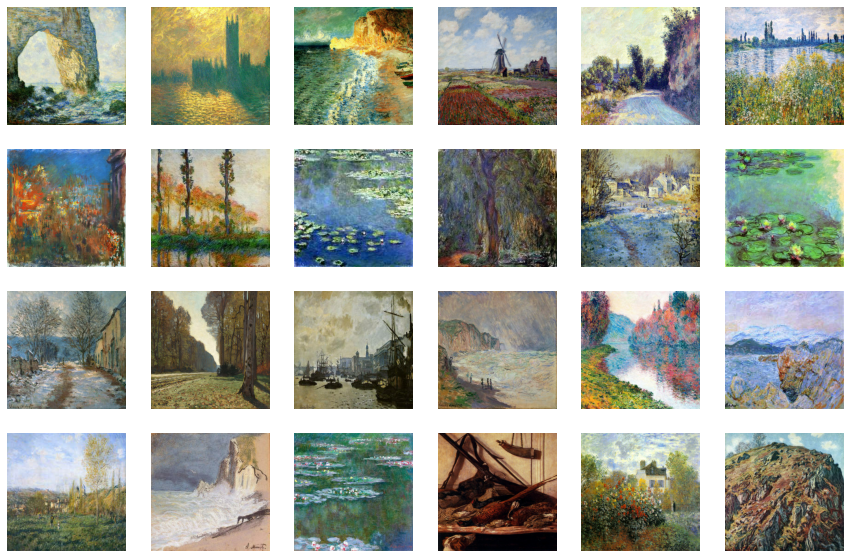

In [34]:
# Showing some Monet paintings

display_samples(load_dataset(MONET_FILENAMES).batch(1), 4, 6)

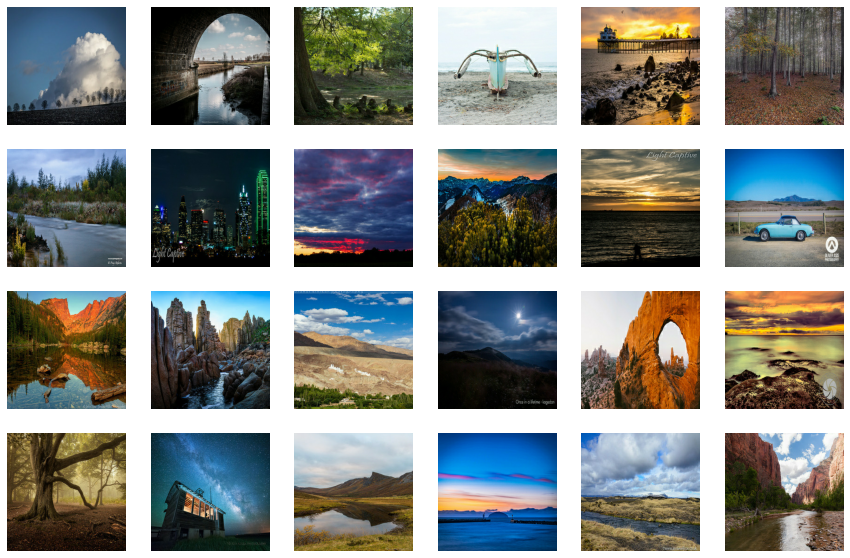

In [8]:
# Showing some photograph images

display_samples(load_dataset(PHOTO_FILENAMES).batch(1), 4, 6)

In [36]:
# Creating dataset for training

BATCH_SIZE = 32

def get_gan_dataset(monet_files, photo_files, repeat=True, shuffle=True, batch_size=1):

    monet_ds = load_dataset(monet_files)
    photo_ds = load_dataset(photo_files)

    if repeat:
        monet_ds = monet_ds.repeat()
        photo_ds = photo_ds.repeat()
        
    if shuffle:
        monet_ds = monet_ds.shuffle(2048)
        photo_ds = photo_ds.shuffle(2048)
        
    monet_ds = monet_ds.batch(batch_size, drop_remainder=True)
    photo_ds = photo_ds.batch(batch_size, drop_remainder=True)

    monet_ds = monet_ds.prefetch(AUTOTUNE)
    photo_ds = photo_ds.prefetch(AUTOTUNE)
    
    gan_ds = tf.data.Dataset.zip((monet_ds, photo_ds))
    
    return gan_ds

final_dataset = get_gan_dataset(MONET_FILENAMES, PHOTO_FILENAMES, repeat=True, shuffle=False, batch_size=BATCH_SIZE)
final_dataset

<ZipDataset shapes: ((32, 256, 256, 3), (32, 256, 256, 3)), types: (tf.float32, tf.float32)>

## Fréchet Inception Distance (FID) 

To assess the quality of the images we will first calculate a metric, the Fréchet Inception Distance (FID Score). FID measures the difference between the probability distributions of the generated images with the real images through comparing the means and the standard deviations of the probability distributions. Here, for two multivariate Gaussian distributions with means $\mu_x$ and $\mu_y$ and covariance matrices $\Sigma_x$ and $\Sigma_y$, the Fréchet distance between these distribution is

$$d^2 = |\mu_x-\mu_y|^2 + tr(\Sigma_x + \Sigma_y -2(\Sigma_x\Sigma_y)^{1/2}$$

To compute the FID Score we will be using the architecture from Inception V3, a Convolutional Neural Network (CNN) developed by Google for Computer Vision and pretrained on the ImageNet with over a million of pictures to capture especially objects of different sizes in images. This way we will speed-up the calculation process through transfer-learning and adjust the model to fit our purposes. This means we will freeze all the weights of the layers so that they won't be adjusting during training, and take all the layers from the previously trained model except the output layer which we change into an Average Pooling Layer that will give a 2D tensor as output. The model will then be composed of the first 8 blocks of layers from the V3 model that have Convolutional, Average Pooling and Max Pooling layers in various compositions that operate as filters with various different sizes carrying different types of mathematical operations on top of the images inorder to capture the special features of the images (e.g. shapes, colors, objects) and whose architecture  can be seen in more detail from the graph below.

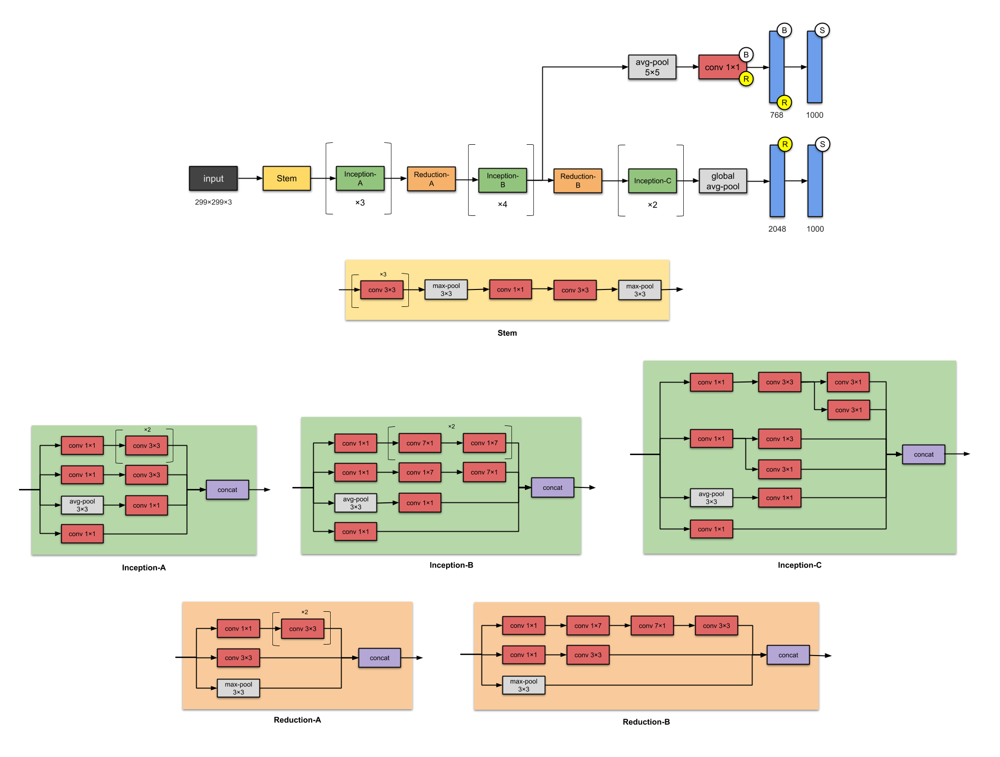

In [5]:
# Creating FID files

fid_photo_ds = load_dataset(PHOTO_FILENAMES).take(1024).batch(32*strategy.num_replicas_in_sync).prefetch(32)
fid_monet_ds = load_dataset(MONET_FILENAMES).batch(32*strategy.num_replicas_in_sync).prefetch(32)

In [6]:
# Transfer-learning with Inception V3 and Frechet Inception Distance

with strategy.scope():

    inception_model = tf.keras.applications.InceptionV3(input_shape=(256,256,3), pooling="avg", include_top=False)

    x  = inception_model.get_layer("mixed9").output # All layers except the last one
    output = tf.keras.layers.GlobalAveragePooling2D()(x) # Average Pooling as output layer

    inception_model = tf.keras.Model(inputs=inception_model.input, outputs=output) # Compiling model
    inception_model.trainable = False # Freezing weights of the layers
   
    def calculate_statistics(images, fid_model):
        """Calculates the means and the standard deviations from the images.
        """
        
        dims = tf.cast(fid_model.predict(images), tf.float32) # Transforming tensor into float32

        mu = tf.reduce_mean(dims, axis=0)
        mean_x = tf.reduce_mean(dims, axis=0, keepdims=True)
        mx = tf.matmul(tf.transpose(mean_x), mean_x)
        vx = tf.matmul(tf.transpose(dims), dims) / tf.cast(tf.shape(dims)[0], tf.float32)
        sigma = vx - mx
            
        return mu, sigma
    
    # Calculate mean and sigma from the paintings
    mu2, sigma2 = calculate_statistics(fid_monet_ds, inception_model)        
    
    
    def calculate_frechet_distance(mu1, sigma1 ,mu2, sigma2):
        """Calculates the Frechet Distance.
        """
        covmean = tf.linalg.sqrtm(tf.cast(tf.matmul(sigma1,sigma2), tf.complex64)) # Square root of matrix
        covmean = tf.cast(tf.math.real(covmean),tf.float32) # Returning the real number from the complex number
  
        tr_covmean = tf.linalg.trace(covmean) # calculating Trace
        
        distance = tf.matmul(tf.expand_dims(mu1 - mu2, axis=0),tf.expand_dims(mu1 - mu2, axis=1)) + tf.linalg.trace(sigma1) + tf.linalg.trace(sigma2) - 2 * tr_covmean

        return distance
       
                                  
    def FID(images, gen_model, inception_model=inception_model, mu2=mu2, sigma2=sigma2):
        """Calculates the FID Score.
        """
        inputs = layers.Input(shape=[256, 256, 3], name='input_image')
        x = gen_model(inputs)
        output = inception_model(x)
        fid_model = tf.keras.Model(inputs=inputs, outputs=output)
                
        mu1, sigma1 = calculate_statistics(images, fid_model)

        fid_score = calculate_frechet_distance(mu1, sigma1, mu2, sigma2)

        return fid_score

## Feature Engineering

As there are only a limited amount of training data, namely paintings made by Claude Monet, we need to find a way to create more training samples that would be similar than the paintings which some little tweaks here and there. For this we will be using Differentiable Augmentation (DiffAugment) which provides a method by imposing various types of differentiable augmentations on the real and generated images (research paper: Shengyu Zhao, Zhijian Liu, Ji Lin, Jun-Yan Zhu and Song Han, (2020), "Differentiable Augmentation for Data-Efficient GAN Training, arXiv:2006.10738v4).

The benefits of using DiffAugment is that the distributions of the images won't be affected so much as they would by just directly manipulating them with data augmentation that would influence the style in for example by changing brightness, contrast of saturation. On the other hand, if we would change only the sizes, or flipping and turning the images, we still wouldn't get enough knowledge on the specific style we would like to reproduce and hence wouldn't lead to a very good generalization. Thus, I've taken the premade functions that adjust the colors through brightness, saturation and contrast with some minor changes, and translation and cutout as they were.

In [26]:
# Feature Engineering with DiffAugment

with strategy.scope():

    def DiffAugment(x, policy='', channels_first=False):
        """Differentiable Augmentation for Data-Efficient GAN Training.
        
        https://github.com/mit-han-lab/data-efficient-gans/tree/master/DiffAugment-stylegan2
        """
        if policy:
            if channels_first:
                x = tf.transpose(x, [0, 2, 3, 1])
            for p in policy.split(','):
                for f in AUGMENT_FNS[p]:
                    x = f(x)
            if channels_first:
                x = tf.transpose(x, [0, 3, 1, 2])
        return x


    def rand_brightness(x):
        magnitude = tf.random.uniform([tf.shape(x)[0], 1, 1, 1]) - 0.5
        x = x + magnitude
        return x


    def rand_saturation(x):
        magnitude = tf.random.uniform([tf.shape(x)[0], 1, 1, 1]) * 2
        x_mean = tf.reduce_sum(x, axis=3, keepdims=True) 
        x = (x - x_mean) * magnitude + x_mean
        return x


    def rand_contrast(x):
        magnitude = tf.random.uniform([tf.shape(x)[0], 1, 1, 1]) + 0.5
        x_mean = tf.reduce_mean(x, axis=[1, 2, 3], keepdims=True) 
        x = (x - x_mean) * magnitude + x_mean
        return x

    def rand_translation(x, ratio=0.125):
        batch_size = tf.shape(x)[0]
        image_size = tf.shape(x)[1:3]
        shift = tf.cast(tf.cast(image_size, tf.float32) * ratio + 0.5, tf.int32)
        translation_x = tf.random.uniform([batch_size, 1], -shift[0], shift[0] + 1, dtype=tf.int32)
        translation_y = tf.random.uniform([batch_size, 1], -shift[1], shift[1] + 1, dtype=tf.int32)
        grid_x = tf.clip_by_value(tf.expand_dims(tf.range(image_size[0], dtype=tf.int32), 0) + translation_x + 1, 0, image_size[0] + 1)
        grid_y = tf.clip_by_value(tf.expand_dims(tf.range(image_size[1], dtype=tf.int32), 0) + translation_y + 1, 0, image_size[1] + 1)
        x = tf.gather_nd(tf.pad(x, [[0, 0], [1, 1], [0, 0], [0, 0]]), tf.expand_dims(grid_x, -1), batch_dims=1)
        x = tf.transpose(tf.gather_nd(tf.pad(tf.transpose(x, [0, 2, 1, 3]), [[0, 0], [1, 1], [0, 0], [0, 0]]), tf.expand_dims(grid_y, -1), batch_dims=1), [0, 2, 1, 3])
        return x


    def rand_cutout(x, ratio=0.5):
        batch_size = tf.shape(x)[0]
        image_size = tf.shape(x)[1:3]
        cutout_size = tf.cast(tf.cast(image_size, tf.float32) * ratio + 0.5, tf.int32)
        offset_x = tf.random.uniform([tf.shape(x)[0], 1, 1], maxval=image_size[0] + (1 - cutout_size[0] % 2), dtype=tf.int32)
        offset_y = tf.random.uniform([tf.shape(x)[0], 1, 1], maxval=image_size[1] + (1 - cutout_size[1] % 2), dtype=tf.int32)
        grid_batch, grid_x, grid_y = tf.meshgrid(tf.range(batch_size, dtype=tf.int32), tf.range(cutout_size[0], dtype=tf.int32), tf.range(cutout_size[1], dtype=tf.int32), indexing='ij')
        cutout_grid = tf.stack([grid_batch, grid_x + offset_x - cutout_size[0] // 2, grid_y + offset_y - cutout_size[1] // 2], axis=-1)
        mask_shape = tf.stack([batch_size, image_size[0], image_size[1]])
        cutout_grid = tf.maximum(cutout_grid, 0)
        cutout_grid = tf.minimum(cutout_grid, tf.reshape(mask_shape - 1, [1, 1, 1, 3]))
        mask = tf.maximum(1 - tf.scatter_nd(cutout_grid, tf.ones([batch_size, cutout_size[0], cutout_size[1]], dtype=tf.float32), mask_shape), 0)
        x = x * tf.expand_dims(mask, axis=3)
        return x


    AUGMENT_FNS = {
        'color': [rand_brightness, rand_saturation, rand_contrast], # selecting color enhancements
        'translation': [rand_translation],                          # selecting translation
        'cutout': [rand_cutout]}                                    # selecting cutout
    
    def aug_fn(image):
        """Function that loads DiffAugment with the desired feature settings.
        """
        return DiffAugment(image,"color,translation,cutout")

## Building the Generator

We are now ready to start building the actual model and for this we will first build the generators that use an encoder to reduce the dimensionality of the image which will help to better extract the features of the images, and then, a decoder that will increase the dimensionality of the image back to where it was in the first place.

The main structure of the generator consists of convolutional layers with a stride which have an instance normalization layer placed on top which normalizes all features of each channel to zero mean and unit variance. This provides a more stable solution compared to batch normalization for example. 

The strive, the length of the step that the filter takes, and the size of the filters are the main adjustable components of the convolutional layers that learn the features from the images. A stride of 2 for example, that we will be using, reduces or increases the height and width by two making the image either smaller or bigger. To make sure that we stay with the same length and height in the images we use same padding which makes sure a certain number of zeros is always added before passing to the next layer. The size of the filters will all be set to (4 by 4). The decoder will also include some dropout layers in the beginning and the layers will be concatenated together to enable skip connections that will help to adjust for possible overfitting issues and to deal with the vanishing gradient problem. In total there will be 24 different layers with over 54 million parameters. 

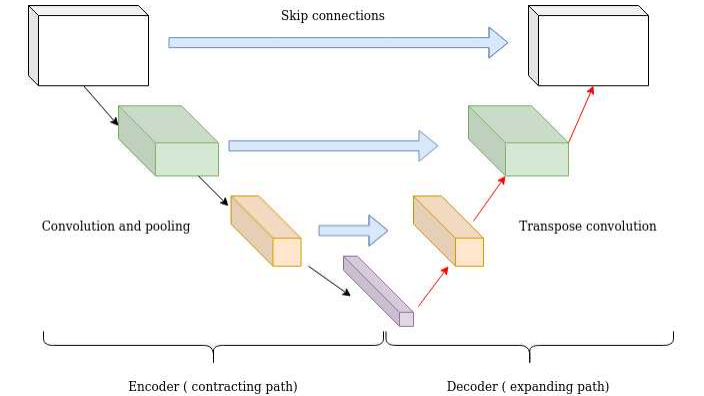

In [8]:
# Encoder to downsize the sample images

def encoder(filters, size, apply_instancenorm=True):
    """Downsizes the sample with a stride of 2 and same padding to control
    for the height and width of the output. Uses a Conv2D layer together with
    InstanceNormalization where the weights are initialized from a normal distribution. 
    Output from LeakyReLU activation function.
    """
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    layer = keras.Sequential()
    layer.add(layers.Conv2D(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))

    if apply_instancenorm:
        layer.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    layer.add(layers.LeakyReLU())

    return layer

In [9]:
# Decoder to upsize the sample images

def decoder(filters, size, apply_dropout=False):
    """Upsizes the sample with a stride of 2 and same padding to control
    for the height and width of the output. Uses a TransposedConv2D layer together
    with InstanceNormalization where the weights are initialized from a normal distribution.
    Option for a Dropout layer. Output from ReLU activation function.
    """
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    layer = keras.Sequential()
    layer.add(layers.Conv2DTranspose(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))
    layer.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    if apply_dropout:
        layer.add(layers.Dropout(0.5))

    layer.add(layers.ReLU())

    return layer

In [10]:
# Generator Function of Encoders and Decoders

def Generator():
    """Generator with a stack of 8 encoder layers and 7 decoder layers.
    Concatenates the layers together to enable skip connections and has options for dropouts.
    
    Input:
        RGB Images of shape (256, 256, 3).
    
    Ouput:
        Pixel values in the range [-1, 1] with the shape (256, 256, 3).
    """
    inputs = layers.Input(shape=[256,256,3])
    
    encoder_stack = [
        encoder(64, 4, apply_instancenorm=False), # (128, 128, 64)
        encoder(128, 4),                          # (64, 64, 128)
        encoder(256, 4),                          # (32, 32, 256)
        encoder(512, 4),                          # (16, 16, 512)
        encoder(512, 4),                          # (8, 8, 512)
        encoder(512, 4),                          # (4, 4, 512)
        encoder(512, 4),                          # (2, 2, 512)
        encoder(512, 4),                          # (1, 1, 512)
    ]

    decoder_stack = [
        decoder(512, 4, apply_dropout=True),        # (2, 2, 1024)
        decoder(512, 4, apply_dropout=True),        # (4, 4, 1024)
        decoder(512, 4, apply_dropout=True),        # (8, 8, 1024)
        decoder(512, 4),                            # (16, 16, 1024)
        decoder(256, 4),                            # (32, 32, 512)
        decoder(128, 4),                            # (64, 64, 256)
        decoder(64, 4),                             # (128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    output_layer = layers.Conv2DTranspose(3, 4, strides=2, padding='same', kernel_initializer=initializer, activation='tanh') 
    

    x = inputs

    # Downsizing through the model
    skips = []
    for down in encoder_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsizing and using skip connections
    for up, skip in zip(decoder_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    output = output_layer(x)

    return keras.Model(inputs=inputs, outputs=output, name='Monet_Generator')

In [43]:
Generator().summary()

Model: "Monet_Generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential_57 (Sequential)     (None, 128, 128, 64  3072        ['input_6[0][0]']                
                                )                                                                 
                                                                                                  
 sequential_58 (Sequential)     (None, 64, 64, 128)  131328      ['sequential_57[0][0]']          
                                                                                    

## Building the Discriminator

The dicriminator needs to distinguish a real painting from a generated painting, and on the other hand, a real image from a generated image. Added to the mix and what makes this more complicated is that we will have a cycle where one generated image from a generator will be given to be evaluated to a Discriminator, but also as an input to the other generator. 
Normally, the discriminator acts in a deep Convolutional Neural Network (CNN) performing image classification. However, usually these models are trained with thousands of even millions of images which we don't have so we need to create some adjustments in order to avoid overfitting.

In the original research paper, there were two discriminators with the same objective function to minimize Mean Squared Error (MSE). However, we will try to improve this model by creating separate function that can handle two different objectives for the Painting Discriminator to minimize, as we want to focus on creating paintings in the style of Claude Monet rather than photographic images from the paintings, and then we will have a separate Discriminator with one objective to distinguish the photographs. Here we want the focus to be on learning the style of painting through the use of brush strokes and colors, rather than learning to generate a photographic image from a painting. The competitive objectives for the Painting Discriminator will hopefully push the Generator in better results.  We will then use InstanceNormalization to standardize each output feature map separetaly rather than across the whole batch that was also used in the research paper. 

In [11]:
def Painting_Discriminator():
    """Dicriminator for the Monet paintings. Reduces first the dimensionality
    of the paintings and adds zero padding before using a Conv2D layer
    together with Instance Normalization. 
    
    The output goes to the Dual Objective function.
    """
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
    
    inputs = layers.Input(shape=[256, 256, 3], name='input_image')
    
    down1 = encoder(64, 4, False)(inputs)    # (128, 128, 64)
    down2 = encoder(128, 4)(down1)           # (64, 64, 128)
    down3 = encoder(256, 4)(down2)           # (32, 32, 256)

    zero_pad = layers.ZeroPadding2D()(down3) # (34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad) # (size, 31, 31, 512)

    norm = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(conv)
    leaky_relu = layers.LeakyReLU()(norm)
    output = layers.ZeroPadding2D()(leaky_relu) # (33, 33, 512)

    return tf.keras.Model(inputs=inputs, outputs=output, name='Painting_Discriminator')

In [12]:
def Dual_Objective():
    """Enables the use of dual objectives, Mean Squared Error (MSE) and Binary Cross-Entropy (BCE)
    for the Painting Discriminator. The input comes from the Painting Discriminator.
    """
    initializer = tf.random_normal_initializer(0., 0.02)
    inputs = layers.Input(shape=[33, 33, 512], name='input_image')
    output = layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(inputs) # (30, 30, 1)

    return tf.keras.Model(inputs=inputs, outputs=output)

In [46]:
Painting_Discriminator().summary()

Model: "Painting_Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 3)]     0         
                                                                 
 sequential_72 (Sequential)  (None, 128, 128, 64)      3072      
                                                                 
 sequential_73 (Sequential)  (None, 64, 64, 128)       131328    
                                                                 
 sequential_74 (Sequential)  (None, 32, 32, 256)       524800    
                                                                 
 zero_padding2d_8 (ZeroPaddi  (None, 34, 34, 256)      0         
 ng2D)                                                           
                                                                 
 conv2d_243 (Conv2D)         (None, 31, 31, 512)       2097152   
                                            

In [13]:
def Photo_Discriminator():
    """Discriminator for the photographic images. Reduces first
    the dimensionality of the images and adds zero padding before using a Conv2D layer
    together with Instance Normalization. 
    """
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
    
    inputs = layers.Input(shape=[256, 256, 3], name='input_image')
    
    down1 = encoder(64, 4, False)(inputs)  # (128, 128, 64)
    down2 = encoder(128, 4)(down1)         # (64, 64, 128)
    down3 = encoder(256, 4)(down2)         # (32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1) # (31, 31, 512)

    norm = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(conv)
    leaky_relu = layers.LeakyReLU()(norm)
    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (33, 33, 512)
    output = layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (30, 30, 1)

    return tf.keras.Model(inputs=inputs, outputs=output, name='Photo_Discriminator')

In [48]:
Photo_Discriminator().summary()

Model: "Photo_Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 3)]     0         
                                                                 
 sequential_75 (Sequential)  (None, 128, 128, 64)      3072      
                                                                 
 sequential_76 (Sequential)  (None, 64, 64, 128)       131328    
                                                                 
 sequential_77 (Sequential)  (None, 32, 32, 256)       524800    
                                                                 
 zero_padding2d_10 (ZeroPadd  (None, 34, 34, 256)      0         
 ing2D)                                                          
                                                                 
 conv2d_247 (Conv2D)         (None, 31, 31, 512)       2097152   
                                               

In [14]:
# Adding generator and discriminator with dual objectives to the first model

with strategy.scope():
    monet_generator = Generator() # Transforms photos to Monet paintings
    photo_generator = Generator() # Transforms Monet paintings to photos

    monet_discriminator = Painting_Discriminator() # Evaluates all Monet paintings 
    photo_discriminator = Photo_Discriminator() # Evaluates all photos 
    
    obj_1 = Dual_Objective() # Objective for MSE Loss
    obj_2 = Dual_Objective() # Objective for BCE Loss

## Learning through the Loss Functions

The CycleGAN model aims to reproduce the distribution of a target dataset via two generators $G_x$ and $G_y$, and two discriminators $D_x$ and $D_y$. The discriminators are trained through the real and generated images, whereas the generators are trained through the discriminators. The generators minimize the loss that is computed through the idea of an adversarial loss that forces the generated images to be indistinguishable from real photos, or as in our case from real paintings. This adversarial loss is also captured through the cycles that aim for a result where the starting photographic image should be as similar as possible to the ending image that has been first transformed into a painting and then back again as a photographic image. The generated images from the first generator is received as input for the second one, and this loss is minimized through the cycle-consistency loss. On top of this we will also have loss that constitutes when a generator fabricates an image or painting that is actually the same as the original image or painting. This is called the identity loss.

We will thus have different kinds of loss functions. First, we need to encounter for the loss that happens when we pass real images through the generators and get back generated images. For this task, we will create two separate loss functions for the generator that creates paintings, namely Binary Cross-Entropy (BCE) and Mean Squared Error (MSE). The idea is that having two competing objectives will hopefully force learning that doesn't overfit easily and also deliver better end results. Then we need to calculate the loss that happens when we pass fake or generated images to the generators and get back an image that is as close as possible to the original, the real image. This is the (forward and backward) cycle-consistency loss that compares the final image to the starting image, and then we have the identiy loss that checks that the generator doesn't fabricate the same image. For these losses we will be using the Mean Absulute Error (MAE) together with weighting - lambda - factor. The general idea will be to compare a matrix made of ones when we have a real painting to a matrix of zeros when the painting has been refabricated, and of course anything in between, in order to eventually reach as close as possible to a real painting. 

The image below shows this visually and a more detailed explanation can be found from the actual research paper: Jun-Yan Zhu, Taeun Park, Phillip Isola and Alexei A. Efros, (2020), "Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks", arXiv:1703:10593).  

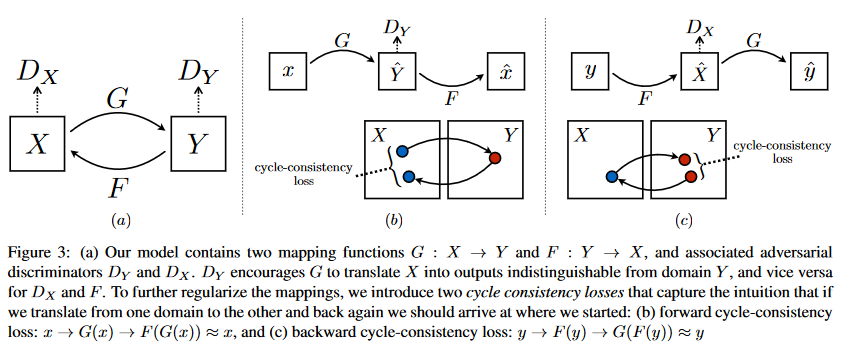

In [15]:
# Loss functions for the CycleGAN model

with strategy.scope(): 

    def discriminator_loss_1(real, fake):
        """Calculates the loss from the Discriminators with the Mean Squared Error (MSE) from
        L2 distances of the real and fake (generated) images,  added with
        a weight parameter that slows down changes to the Discriminators relative to the Generators.
        """
        real_loss = tf.reduce_mean(tf.ones_like(real)-real)**2
        generated_loss = tf.reduce_mean(tf.zeros_like(fake)-fake)**2
        loss = (real_loss + generated_loss) * 0.5
        
        return loss

    def discriminator_loss_2(real, fake):
        """Calculates the loss from the Painting Discriminator with Binary Cross-Entropy (BCE)
        from the fake (generated) images. A weight parameter slows down changes to the Discriminator
        relative to the Generator.
        """
        generated_loss = keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(fake), fake)
        real_loss = keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(real), real)
        total_disc_loss = real_loss + generated_loss
        loss = tf.reduce_mean(total_disc_loss * 0.5)
        
        return loss
    
    def generator_loss_1(fake):
        """Calculates the loss from the Generators with the Mean Squared Error (MSE) of the
        generated loss from L2 distances of the fake (generated) images.
        """
        loss = tf.reduce_mean(tf.ones_like(fake)-fake)**2
        
        return  loss

    def generator_loss_2(fake):
        """Calculates the loss from the Painting Generator with Binary Cross-Entropy (BCE)
        from the fake (generated) images.
        """
        loss = tf.reduce_mean(keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(fake), fake))
        
        return loss
    
    def cycle_loss(real_image, cycled_image, LAMBDA):
        """Calculates the cycle consistency loss with the Mean Absulate Error (MAE)
        which is the sum of the L1 distances from the real and generated images.
        Adjusted with a lambda cycle factor.
        """  
        loss = tf.reduce_sum(tf.abs(real_image - cycled_image))

        return LAMBDA * loss 
    
    def identity_loss(real_image, same_image, LAMBDA):
        """Calculates the identity loss with the Mean Absolute Error (MAE)
        which is the sum of the L1 distances from the real and generated images
        that come from the generator itself after a full cycle.
        Adjusted with a lambda cycle factor.
        """
        loss = tf.reduce_sum(tf.abs(real_image - same_image))
        
        return LAMBDA * loss

## CycleGAN Model

GAN models never converge completely, but instead try to find an equilibrium between the generators and discriminators. Thus, we can control for the quality with the FID score where we aim to score as low as possible, and of course through evaluating the generated paintings. We will thus create a monitoring function together with the CycleGAN model that will generate paintings after every epoch that will help to evaluate the progress, and then analyze the FID score and the paintings at the end.

In [16]:
class CycleGAN(keras.Model):
    """The CycleGAN model with two Generators and two Discriminators.
    The Generator and Discriminator that evaluates the paintings has two different objectives
    it tries to minimize.
   
    
    Args:
        monet_generator : Generator that creates paintings from images
        photo_generator : Generator that creates images from paintings
        monet_discriminator : Discriminator that evaluates the paintings
        photo_discriminator : Discriminator that evaluates the images
        obj_1 : 1st Objective for the monet_generator and monet_discriminator
        obj_2 : 2nd Objective for the monet_generator and monet_discriminator
        lambda_cycle : Weight for the cycle consistency loss
        lambda_id : Weight for the Identity loss
        
    """
    def __init__(
        self,
        monet_generator,
        photo_generator,
        monet_discriminator,
        photo_discriminator,
        obj_1,        
        obj_2,        
        lambda_cycle=10, 
        lambda_id=0.5,
    ):
        super(CycleGAN, self).__init__()
        self.m_gen = monet_generator
        self.p_gen = photo_generator
        self.m_disc = monet_discriminator
        self.p_disc = photo_discriminator
        self.lambda_cycle = lambda_cycle
        self.lambda_id = lambda_id
        self.obj_1 = obj_1
        self.obj_2 = obj_2
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_1,
        gen_loss_2,
        disc_loss_1,
        disc_loss_2,
        cycle_loss,
        identity_loss,
        aug_fn,

    ):
        super(CycleGAN, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_1 = gen_loss_1
        self.gen_loss_2 = gen_loss_2
        self.disc_loss_1 = disc_loss_1
        self.disc_loss_2 = disc_loss_2
        self.cycle_loss = cycle_loss
        self.identity_loss = identity_loss
        self.aug_fn = aug_fn

        self.step_num = 0
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        batch_size = tf.shape(real_monet)[0]
        with tf.GradientTape(persistent=True) as tape:
        
            # Photograph -> Fake Monet
            fake_monet = self.m_gen(real_photo, training=True)
            # Photograph -> Fake Monet -> Cycled Phograph
            cycled_photo = self.p_gen(fake_monet, training=True)

            # Monet -> Fake Photograph
            fake_photo = self.p_gen(real_monet, training=True)
            # Monet -> Fake Photograph -> Cycled Monet
            cycled_monet = self.m_gen(fake_photo, training=True)

            # Generating the same Monet or the same Photograph
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)  
            
            # Diffaugment
            both_monet = tf.concat([real_monet, fake_monet], axis=0)            
            aug_monet = self.aug_fn(both_monet)
            
            aug_real_monet = aug_monet[:batch_size]
            aug_fake_monet = aug_monet[batch_size:]
                 
            # Initializing Painting Discriminator outputs with 2 objectives
            monet_disc_fake_1 = self.obj_1(self.m_disc(aug_fake_monet, training=True), training=True)
            monet_disc_real_1 = self.obj_1(self.m_disc(aug_real_monet, training=True), training=True)
            
            monet_disc_fake_2 = self.obj_2(self.m_disc(aug_fake_monet, training=True), training=True)
            monet_disc_real_2 = self.obj_2(self.m_disc(aug_real_monet, training=True), training=True)

            # Generator Adverserial loss for Monet paintings
            monet_gen_loss_1 = self.gen_loss_1(monet_disc_fake_1) 
            monet_gen_loss_2 = self.gen_loss_2(monet_disc_fake_2)
            
            monet_gen_loss = (monet_gen_loss_1 + monet_gen_loss_2) * 0.5
            
            # Discriminator Loss for Monet paintings
            monet_disc_loss_1 = self.disc_loss_1(monet_disc_real_1, monet_disc_fake_1)
            monet_disc_loss_2 = self.disc_loss_2(monet_disc_real_2, monet_disc_fake_2)

            monet_disc_loss = (monet_disc_loss_1 + monet_disc_loss_2) * 0.5
      
            # Initializing Photo Discriminator outputs
            photo_disc_real = self.p_disc(real_photo, training=True)
            photo_disc_fake = self.p_disc(fake_photo, training=True)

            # Generator and Discriminator loss for Photograph Images
            photo_gen_loss = self.gen_loss_1(photo_disc_fake)
            photo_disc_loss = self.disc_loss_1(photo_disc_real, photo_disc_fake)

            # Cycle Consistency Loss 
            monet_cycle_loss = self.cycle_loss(real_monet, cycled_monet, self.lambda_cycle) 
            photo_cycle_loss = self.cycle_loss(real_photo, cycled_photo, self.lambda_cycle) 
            total_cycle_loss = monet_cycle_loss + photo_cycle_loss
            
            # Identify Losses
            monet_identity_loss = self.identity_loss(real_monet, same_monet, self.lambda_id * self.lambda_cycle) 
            photo_identity_loss = self.identity_loss(real_photo, same_photo, self.lambda_id * self.lambda_cycle) 
            
            # Total Generator Losses
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss +  monet_identity_loss
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + photo_identity_loss


        # Calculate the gradients for the generators and discriminatora
        monet_generator_gradients = tape.gradient(total_monet_gen_loss, self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss, self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss, self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss, self.p_disc.trainable_variables)
        
        # Calculate the gradients and update weights for the Dual Objectives
        monet_obj_1_gradients = tape.gradient(monet_disc_loss_1, self.obj_1.trainable_variables)
        self.m_disc_optimizer.apply_gradients(zip(monet_obj_1_gradients, self.obj_1.trainable_variables))       

        monet_obj_2_gradients = tape.gradient(monet_disc_loss_2, self.obj_2.trainable_variables)
        self.m_disc_optimizer.apply_gradients(zip(monet_obj_2_gradients, self.obj_2.trainable_variables))     
        
        # Update weights of the generators and discriminators
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients, self.m_gen.trainable_variables))
        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients, self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients, self.m_disc.trainable_variables))
        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients, self.p_disc.trainable_variables))
        
        
        return {
            "Monet_Disc_AVG_Loss": monet_disc_loss_1, 
            "Monet_Disc_BCE_Loss": monet_disc_loss_2, 
            "Monet_Disc_Loss": monet_disc_loss,
            "Monet_Gen_AVG_Loss": monet_gen_loss_1,
            "Monet_Gen_BCE_Loss": monet_gen_loss_2,
            "Monet_Gen_Loss": monet_gen_loss,
            "Photo_Disc_Loss": photo_disc_loss,
            "Photo_Gen_Loss": photo_gen_loss,
            }

In [17]:
# Callback to periodically show the generated images

class GANMonitor(keras.callbacks.Callback):
    """Callback to generate images after each epoch.
    """
    
    def __init__(self, num_img=4):
        self.num_img = num_img
    
    def on_epoch_end(self, epoch, logs=None):
        _, ax = plt.subplots(4, 2, figsize=(12, 12))
        for i, img in enumerate(photo_ds.take(self.num_img)):
            prediction = self.model.m_gen(img)[0].numpy()  # Making prediction
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8) # Scaling back from [-1,1]
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)
            
            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Photograph")
            ax[i, 1].set_title("Generated Painting")
            ax[i, 0].axis('off')
            ax[i, 1].axis('off')
                  
        plt.show()
        plt.close()

In [19]:
# Initializing training run for the first model

with strategy.scope():
    
    # Exponentially decaying learning rate with Adam optimizer
    initial_learning_rate = 2e-4
    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(initial_learning_rate, decay_steps=15, decay_rate=0.98, staircase=True)
    monet_generator_optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule, beta_1=0.5)

    monet_discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule, beta_1=0.5)
    
    # Creating the model
    cycle_gan_model = CycleGAN(monet_generator, photo_generator, monet_discriminator, photo_discriminator, obj_1,  obj_2)
    
    # Compiling the model
    cycle_gan_model.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_1 = generator_loss_1,
        gen_loss_2 = generator_loss_2,
        disc_loss_1 = discriminator_loss_1,
        disc_loss_2 = discriminator_loss_2,
        cycle_loss = cycle_loss,
        identity_loss = identity_loss,
        aug_fn = aug_fn)
    
    # Callback for monitoring progress
    monitor = GANMonitor()

Epoch 1/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.3644 - Monet_Disc_BCE_Loss: 0.6923 - Monet_Disc_Loss: 0.5283 - Monet_Gen_AVG_Loss: 0.6962 - Monet_Gen_BCE_Loss: 0.6752 - Monet_Gen_Loss: 0.6857 - Photo_Disc_Loss: 0.4028 - Photo_Gen_Loss: 0.8428  

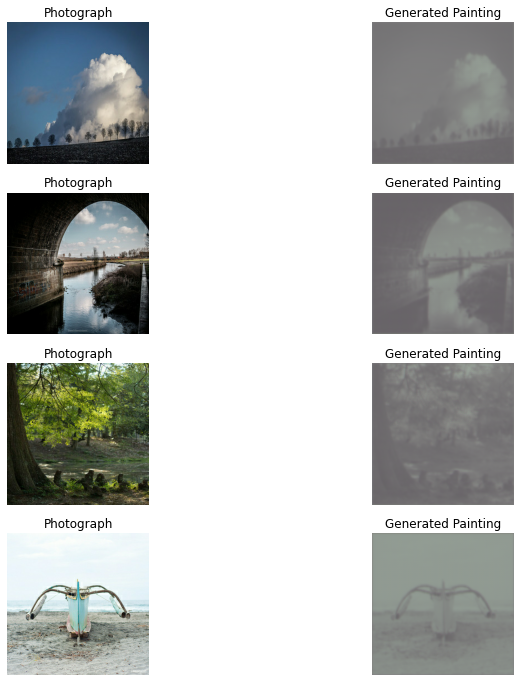

15/15 [==============================] - 1909s 127s/step - Monet_Disc_AVG_Loss: 0.3575 - Monet_Disc_BCE_Loss: 0.6923 - Monet_Disc_Loss: 0.5249 - Monet_Gen_AVG_Loss: 0.6762 - Monet_Gen_BCE_Loss: 0.6749 - Monet_Gen_Loss: 0.6755 - Photo_Disc_Loss: 0.3967 - Photo_Gen_Loss: 0.8286
Epoch 2/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.2216 - Monet_Disc_BCE_Loss: 0.6874 - Monet_Disc_Loss: 0.4545 - Monet_Gen_AVG_Loss: 0.3295 - Monet_Gen_BCE_Loss: 0.6591 - Monet_Gen_Loss: 0.4943 - Photo_Disc_Loss: 0.2490 - Photo_Gen_Loss: 0.4803  

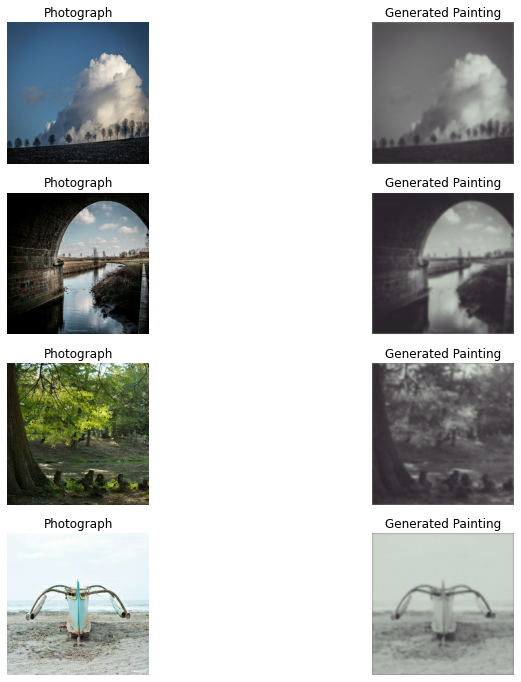

15/15 [==============================] - 1935s 129s/step - Monet_Disc_AVG_Loss: 0.2223 - Monet_Disc_BCE_Loss: 0.6875 - Monet_Disc_Loss: 0.4549 - Monet_Gen_AVG_Loss: 0.3218 - Monet_Gen_BCE_Loss: 0.6574 - Monet_Gen_Loss: 0.4896 - Photo_Disc_Loss: 0.2486 - Photo_Gen_Loss: 0.4669
Epoch 3/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.1586 - Monet_Disc_BCE_Loss: 0.6613 - Monet_Disc_Loss: 0.4099 - Monet_Gen_AVG_Loss: 0.3761 - Monet_Gen_BCE_Loss: 0.6595 - Monet_Gen_Loss: 0.5178 - Photo_Disc_Loss: 0.2276 - Photo_Gen_Loss: 0.3030  

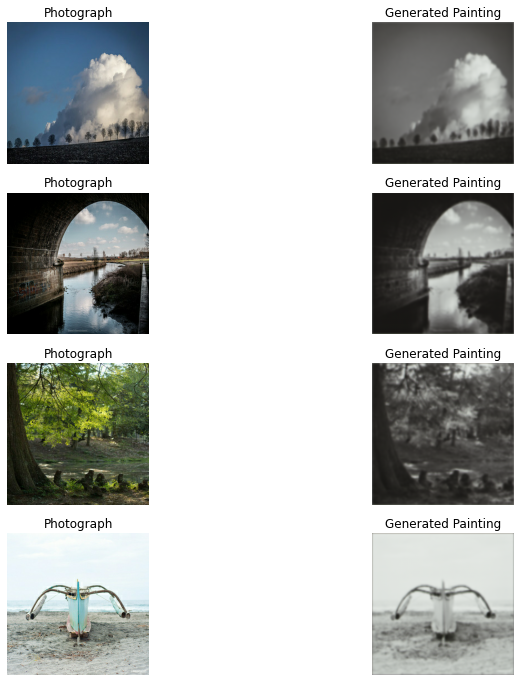

15/15 [==============================] - 1896s 126s/step - Monet_Disc_AVG_Loss: 0.1598 - Monet_Disc_BCE_Loss: 0.6617 - Monet_Disc_Loss: 0.4108 - Monet_Gen_AVG_Loss: 0.3664 - Monet_Gen_BCE_Loss: 0.6556 - Monet_Gen_Loss: 0.5110 - Photo_Disc_Loss: 0.2282 - Photo_Gen_Loss: 0.2971
Epoch 4/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.0854 - Monet_Disc_BCE_Loss: 0.6060 - Monet_Disc_Loss: 0.3457 - Monet_Gen_AVG_Loss: 0.5157 - Monet_Gen_BCE_Loss: 0.6927 - Monet_Gen_Loss: 0.6042 - Photo_Disc_Loss: 0.1697 - Photo_Gen_Loss: 0.3801  

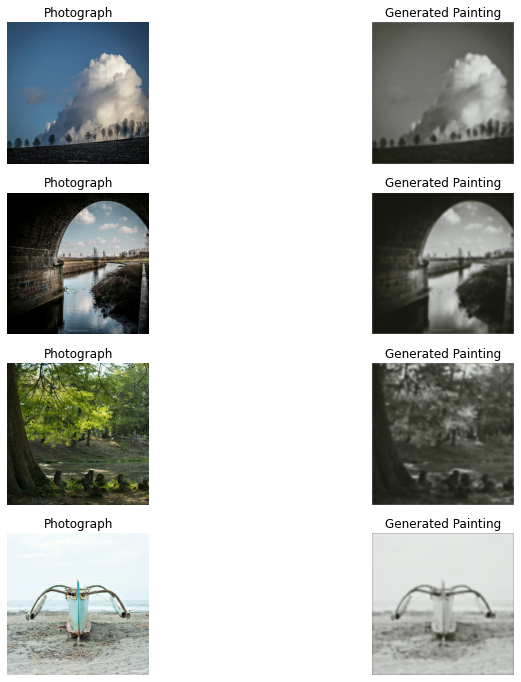

15/15 [==============================] - 1947s 131s/step - Monet_Disc_AVG_Loss: 0.0830 - Monet_Disc_BCE_Loss: 0.6033 - Monet_Disc_Loss: 0.3432 - Monet_Gen_AVG_Loss: 0.5249 - Monet_Gen_BCE_Loss: 0.6964 - Monet_Gen_Loss: 0.6107 - Photo_Disc_Loss: 0.1668 - Photo_Gen_Loss: 0.3838
Epoch 5/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.0581 - Monet_Disc_BCE_Loss: 0.5556 - Monet_Disc_Loss: 0.3068 - Monet_Gen_AVG_Loss: 0.5878 - Monet_Gen_BCE_Loss: 0.7382 - Monet_Gen_Loss: 0.6630 - Photo_Disc_Loss: 0.1165 - Photo_Gen_Loss: 0.4330  

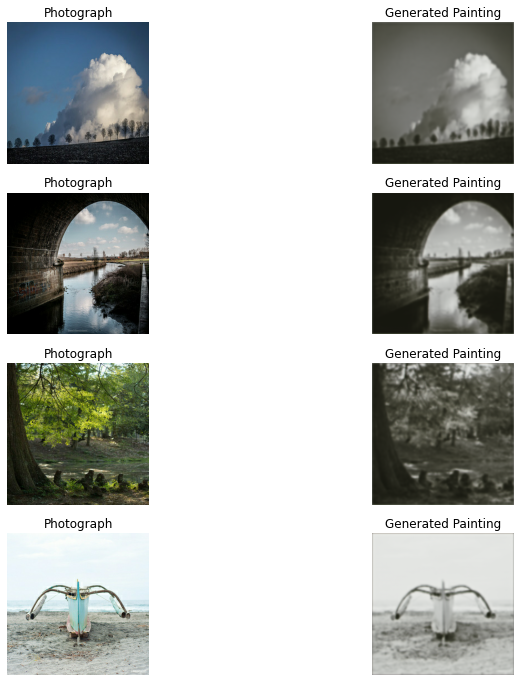

15/15 [==============================] - 1816s 121s/step - Monet_Disc_AVG_Loss: 0.0587 - Monet_Disc_BCE_Loss: 0.5560 - Monet_Disc_Loss: 0.3073 - Monet_Gen_AVG_Loss: 0.5889 - Monet_Gen_BCE_Loss: 0.7396 - Monet_Gen_Loss: 0.6642 - Photo_Disc_Loss: 0.1150 - Photo_Gen_Loss: 0.4386
Epoch 6/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.0333 - Monet_Disc_BCE_Loss: 0.5071 - Monet_Disc_Loss: 0.2702 - Monet_Gen_AVG_Loss: 0.6661 - Monet_Gen_BCE_Loss: 0.8107 - Monet_Gen_Loss: 0.7384 - Photo_Disc_Loss: 0.0618 - Photo_Gen_Loss: 0.5536  

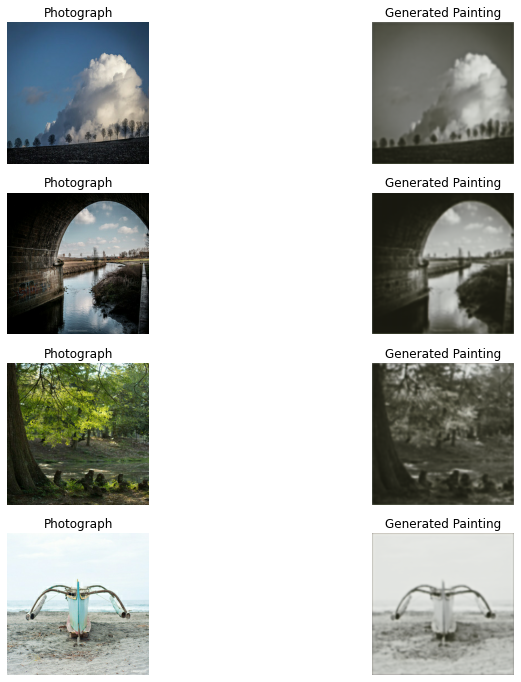

15/15 [==============================] - 1803s 121s/step - Monet_Disc_AVG_Loss: 0.0324 - Monet_Disc_BCE_Loss: 0.5060 - Monet_Disc_Loss: 0.2692 - Monet_Gen_AVG_Loss: 0.6696 - Monet_Gen_BCE_Loss: 0.8131 - Monet_Gen_Loss: 0.7413 - Photo_Disc_Loss: 0.0608 - Photo_Gen_Loss: 0.5543
Epoch 7/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.0262 - Monet_Disc_BCE_Loss: 0.4729 - Monet_Disc_Loss: 0.2495 - Monet_Gen_AVG_Loss: 0.7423 - Monet_Gen_BCE_Loss: 0.8838 - Monet_Gen_Loss: 0.8130 - Photo_Disc_Loss: 0.0434 - Photo_Gen_Loss: 0.5925  

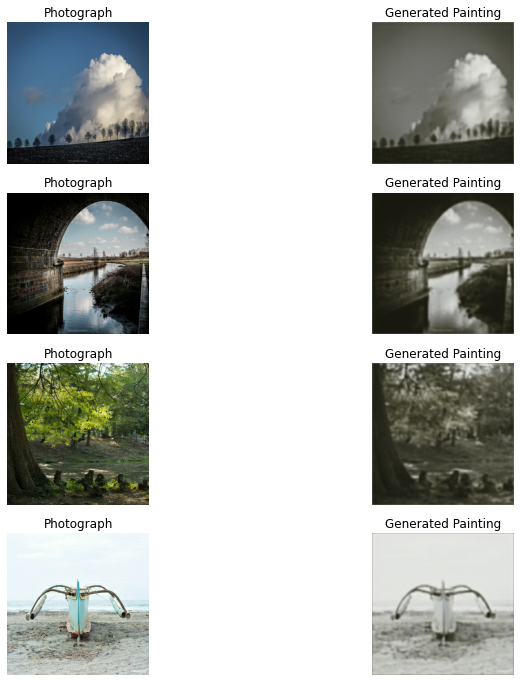

15/15 [==============================] - 1746s 117s/step - Monet_Disc_AVG_Loss: 0.0252 - Monet_Disc_BCE_Loss: 0.4714 - Monet_Disc_Loss: 0.2483 - Monet_Gen_AVG_Loss: 0.7493 - Monet_Gen_BCE_Loss: 0.8895 - Monet_Gen_Loss: 0.8194 - Photo_Disc_Loss: 0.0431 - Photo_Gen_Loss: 0.5917
Epoch 8/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.0130 - Monet_Disc_BCE_Loss: 0.4482 - Monet_Disc_Loss: 0.2306 - Monet_Gen_AVG_Loss: 0.8134 - Monet_Gen_BCE_Loss: 0.9698 - Monet_Gen_Loss: 0.8916 - Photo_Disc_Loss: 0.0298 - Photo_Gen_Loss: 0.6505  

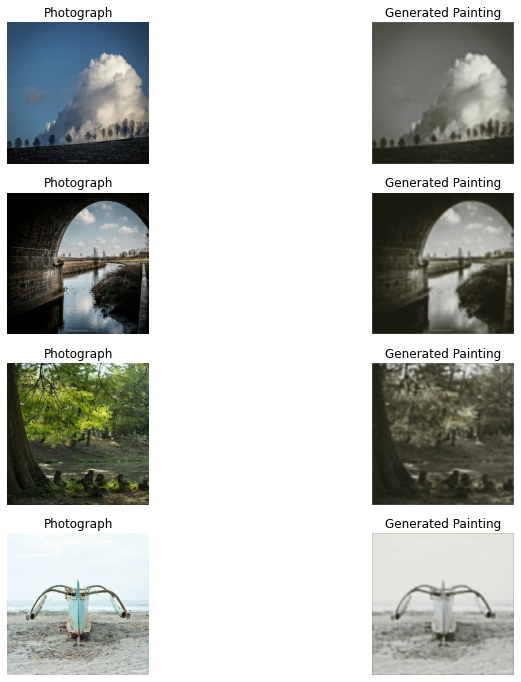

15/15 [==============================] - 1797s 120s/step - Monet_Disc_AVG_Loss: 0.0143 - Monet_Disc_BCE_Loss: 0.4509 - Monet_Disc_Loss: 0.2326 - Monet_Gen_AVG_Loss: 0.7967 - Monet_Gen_BCE_Loss: 0.9610 - Monet_Gen_Loss: 0.8789 - Photo_Disc_Loss: 0.0298 - Photo_Gen_Loss: 0.6497
Epoch 9/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.0300 - Monet_Disc_BCE_Loss: 0.4736 - Monet_Disc_Loss: 0.2518 - Monet_Gen_AVG_Loss: 0.8166 - Monet_Gen_BCE_Loss: 1.0180 - Monet_Gen_Loss: 0.9173 - Photo_Disc_Loss: 0.0219 - Photo_Gen_Loss: 0.6998  

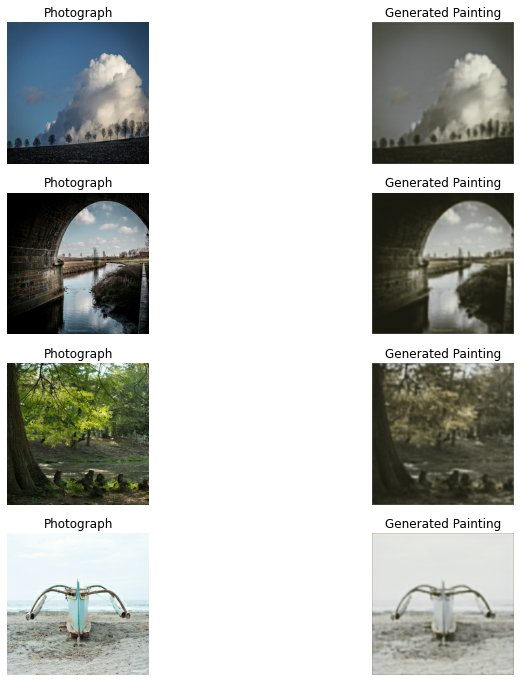

15/15 [==============================] - 1742s 116s/step - Monet_Disc_AVG_Loss: 0.0291 - Monet_Disc_BCE_Loss: 0.4670 - Monet_Disc_Loss: 0.2480 - Monet_Gen_AVG_Loss: 0.8253 - Monet_Gen_BCE_Loss: 1.0242 - Monet_Gen_Loss: 0.9247 - Photo_Disc_Loss: 0.0214 - Photo_Gen_Loss: 0.7004
Epoch 10/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.0628 - Monet_Disc_BCE_Loss: 0.4798 - Monet_Disc_Loss: 0.2713 - Monet_Gen_AVG_Loss: 0.8446 - Monet_Gen_BCE_Loss: 1.0644 - Monet_Gen_Loss: 0.9545 - Photo_Disc_Loss: 0.0379 - Photo_Gen_Loss: 0.6686  

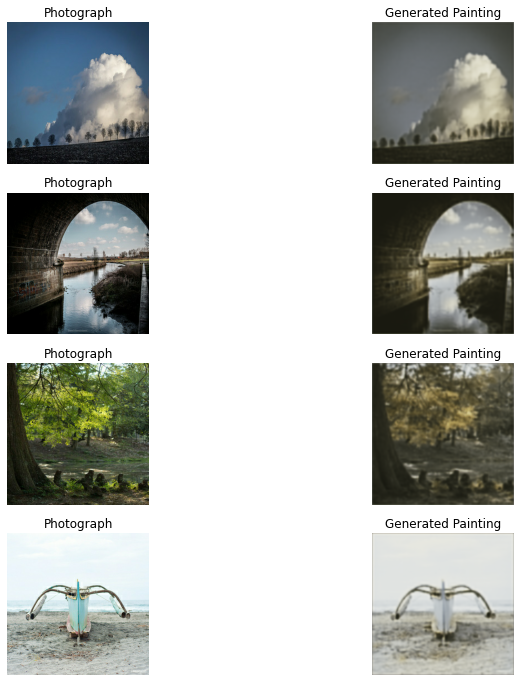

15/15 [==============================] - 1775s 118s/step - Monet_Disc_AVG_Loss: 0.0753 - Monet_Disc_BCE_Loss: 0.4874 - Monet_Disc_Loss: 0.2813 - Monet_Gen_AVG_Loss: 0.8685 - Monet_Gen_BCE_Loss: 1.0797 - Monet_Gen_Loss: 0.9741 - Photo_Disc_Loss: 0.0385 - Photo_Gen_Loss: 0.6665
Epoch 11/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.0291 - Monet_Disc_BCE_Loss: 0.4893 - Monet_Disc_Loss: 0.2592 - Monet_Gen_AVG_Loss: 0.7755 - Monet_Gen_BCE_Loss: 1.0709 - Monet_Gen_Loss: 0.9232 - Photo_Disc_Loss: 0.0479 - Photo_Gen_Loss: 0.6417  

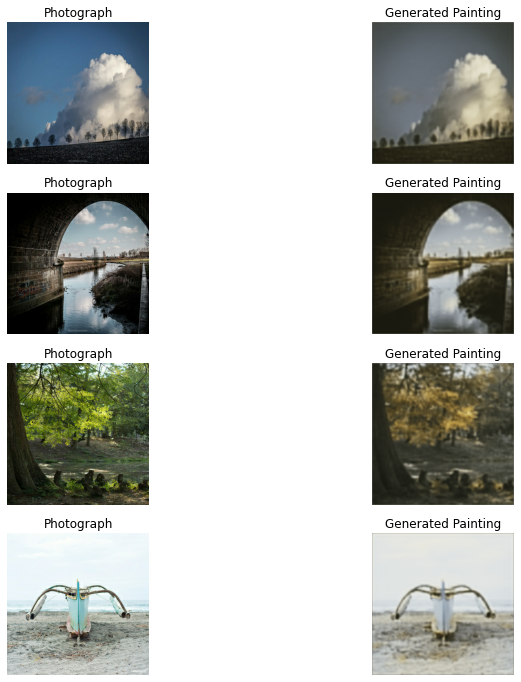

15/15 [==============================] - 1783s 119s/step - Monet_Disc_AVG_Loss: 0.0288 - Monet_Disc_BCE_Loss: 0.4877 - Monet_Disc_Loss: 0.2582 - Monet_Gen_AVG_Loss: 0.7871 - Monet_Gen_BCE_Loss: 1.0777 - Monet_Gen_Loss: 0.9324 - Photo_Disc_Loss: 0.0461 - Photo_Gen_Loss: 0.6458
Epoch 12/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.0325 - Monet_Disc_BCE_Loss: 0.5055 - Monet_Disc_Loss: 0.2690 - Monet_Gen_AVG_Loss: 0.7242 - Monet_Gen_BCE_Loss: 1.0507 - Monet_Gen_Loss: 0.8874 - Photo_Disc_Loss: 0.0547 - Photo_Gen_Loss: 0.6215  

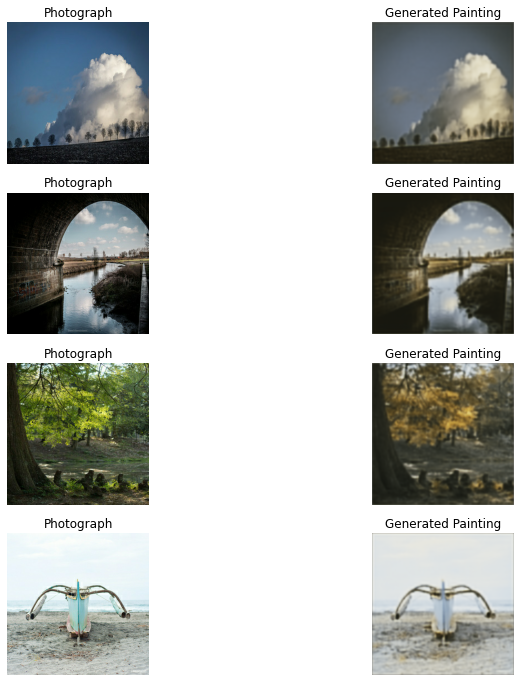

15/15 [==============================] - 1733s 116s/step - Monet_Disc_AVG_Loss: 0.0374 - Monet_Disc_BCE_Loss: 0.5135 - Monet_Disc_Loss: 0.2755 - Monet_Gen_AVG_Loss: 0.6968 - Monet_Gen_BCE_Loss: 1.0322 - Monet_Gen_Loss: 0.8645 - Photo_Disc_Loss: 0.0563 - Photo_Gen_Loss: 0.6369
Epoch 13/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.0410 - Monet_Disc_BCE_Loss: 0.4910 - Monet_Disc_Loss: 0.2660 - Monet_Gen_AVG_Loss: 0.7878 - Monet_Gen_BCE_Loss: 1.0861 - Monet_Gen_Loss: 0.9370 - Photo_Disc_Loss: 0.0970 - Photo_Gen_Loss: 0.5579  

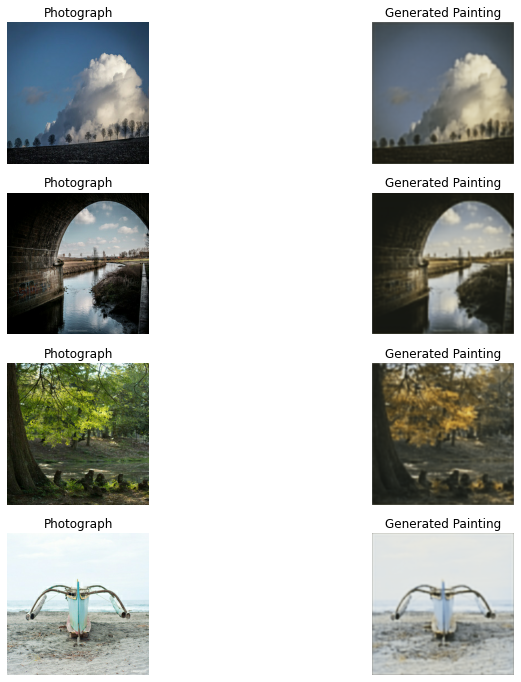

15/15 [==============================] - 1773s 118s/step - Monet_Disc_AVG_Loss: 0.0414 - Monet_Disc_BCE_Loss: 0.4946 - Monet_Disc_Loss: 0.2680 - Monet_Gen_AVG_Loss: 0.7741 - Monet_Gen_BCE_Loss: 1.0795 - Monet_Gen_Loss: 0.9268 - Photo_Disc_Loss: 0.0938 - Photo_Gen_Loss: 0.5596
Epoch 14/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.0158 - Monet_Disc_BCE_Loss: 0.4467 - Monet_Disc_Loss: 0.2312 - Monet_Gen_AVG_Loss: 0.8651 - Monet_Gen_BCE_Loss: 1.1320 - Monet_Gen_Loss: 0.9986 - Photo_Disc_Loss: 0.0725 - Photo_Gen_Loss: 0.6142  

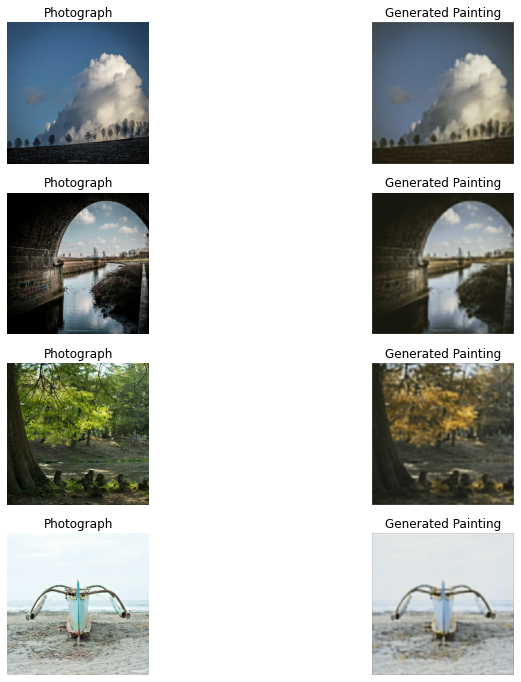

15/15 [==============================] - 1820s 122s/step - Monet_Disc_AVG_Loss: 0.0170 - Monet_Disc_BCE_Loss: 0.4418 - Monet_Disc_Loss: 0.2294 - Monet_Gen_AVG_Loss: 0.8641 - Monet_Gen_BCE_Loss: 1.1313 - Monet_Gen_Loss: 0.9977 - Photo_Disc_Loss: 0.0724 - Photo_Gen_Loss: 0.6077
Epoch 15/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.0162 - Monet_Disc_BCE_Loss: 0.4330 - Monet_Disc_Loss: 0.2246 - Monet_Gen_AVG_Loss: 0.9120 - Monet_Gen_BCE_Loss: 1.1668 - Monet_Gen_Loss: 1.0394 - Photo_Disc_Loss: 0.0746 - Photo_Gen_Loss: 0.6410  

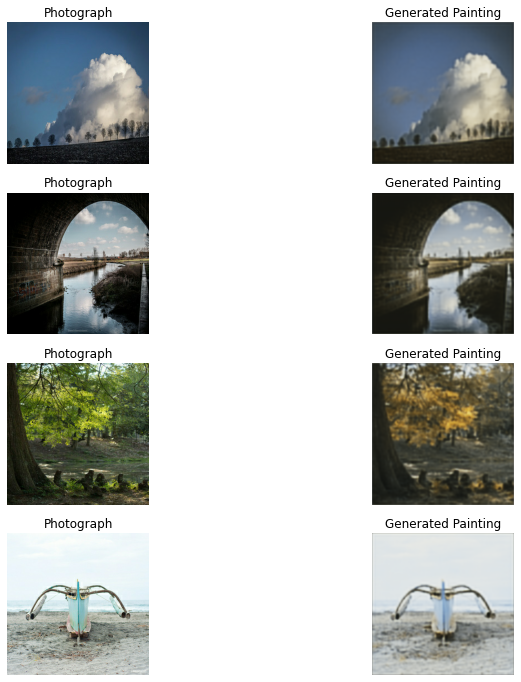

15/15 [==============================] - 1865s 125s/step - Monet_Disc_AVG_Loss: 0.0159 - Monet_Disc_BCE_Loss: 0.4336 - Monet_Disc_Loss: 0.2247 - Monet_Gen_AVG_Loss: 0.9126 - Monet_Gen_BCE_Loss: 1.1687 - Monet_Gen_Loss: 1.0406 - Photo_Disc_Loss: 0.0702 - Photo_Gen_Loss: 0.6521
Epoch 16/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.0072 - Monet_Disc_BCE_Loss: 0.3861 - Monet_Disc_Loss: 0.1966 - Monet_Gen_AVG_Loss: 0.9803 - Monet_Gen_BCE_Loss: 1.2281 - Monet_Gen_Loss: 1.1042 - Photo_Disc_Loss: 0.0098 - Photo_Gen_Loss: 0.8087  

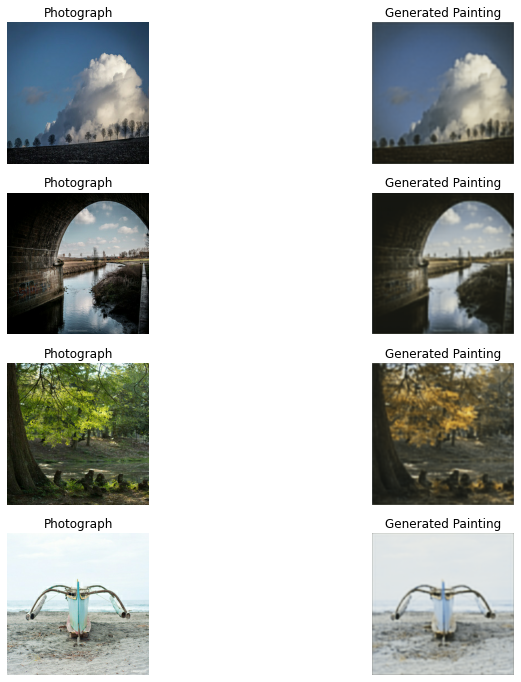

15/15 [==============================] - 1773s 118s/step - Monet_Disc_AVG_Loss: 0.0068 - Monet_Disc_BCE_Loss: 0.3842 - Monet_Disc_Loss: 0.1955 - Monet_Gen_AVG_Loss: 0.9848 - Monet_Gen_BCE_Loss: 1.2324 - Monet_Gen_Loss: 1.1086 - Photo_Disc_Loss: 0.0093 - Photo_Gen_Loss: 0.8141
Epoch 17/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.0073 - Monet_Disc_BCE_Loss: 0.3857 - Monet_Disc_Loss: 0.1965 - Monet_Gen_AVG_Loss: 0.9764 - Monet_Gen_BCE_Loss: 1.2453 - Monet_Gen_Loss: 1.1108 - Photo_Disc_Loss: 0.0047 - Photo_Gen_Loss: 0.8761  

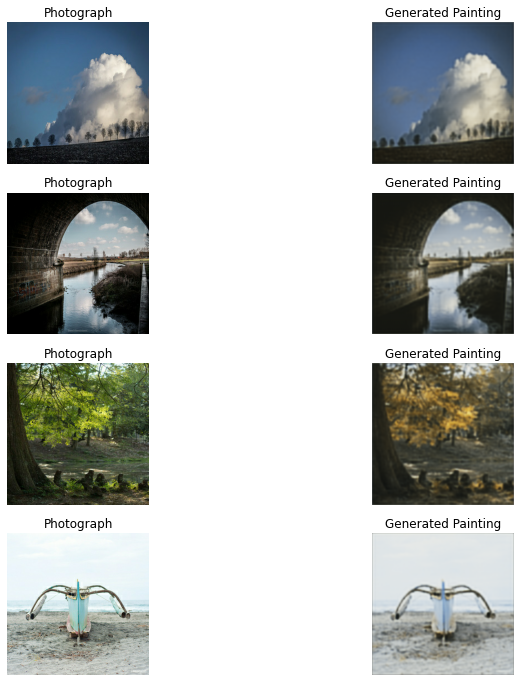

15/15 [==============================] - 1762s 118s/step - Monet_Disc_AVG_Loss: 0.0071 - Monet_Disc_BCE_Loss: 0.3856 - Monet_Disc_Loss: 0.1963 - Monet_Gen_AVG_Loss: 0.9707 - Monet_Gen_BCE_Loss: 1.2418 - Monet_Gen_Loss: 1.1062 - Photo_Disc_Loss: 0.0045 - Photo_Gen_Loss: 0.8769
Epoch 18/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.0063 - Monet_Disc_BCE_Loss: 0.3763 - Monet_Disc_Loss: 0.1913 - Monet_Gen_AVG_Loss: 0.9681 - Monet_Gen_BCE_Loss: 1.2767 - Monet_Gen_Loss: 1.1224 - Photo_Disc_Loss: 0.0050 - Photo_Gen_Loss: 0.8810  

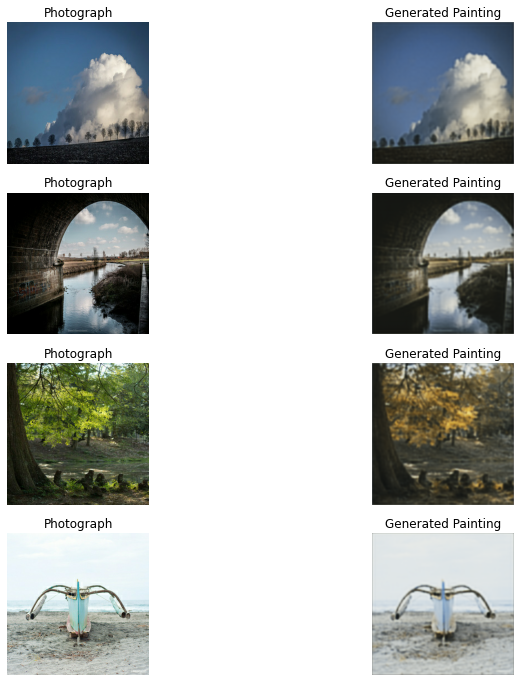

15/15 [==============================] - 1746s 116s/step - Monet_Disc_AVG_Loss: 0.0061 - Monet_Disc_BCE_Loss: 0.3796 - Monet_Disc_Loss: 0.1929 - Monet_Gen_AVG_Loss: 0.9595 - Monet_Gen_BCE_Loss: 1.2707 - Monet_Gen_Loss: 1.1151 - Photo_Disc_Loss: 0.0048 - Photo_Gen_Loss: 0.8812
Epoch 19/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.0047 - Monet_Disc_BCE_Loss: 0.3664 - Monet_Disc_Loss: 0.1855 - Monet_Gen_AVG_Loss: 0.9964 - Monet_Gen_BCE_Loss: 1.3324 - Monet_Gen_Loss: 1.1644 - Photo_Disc_Loss: 0.0057 - Photo_Gen_Loss: 0.9189  

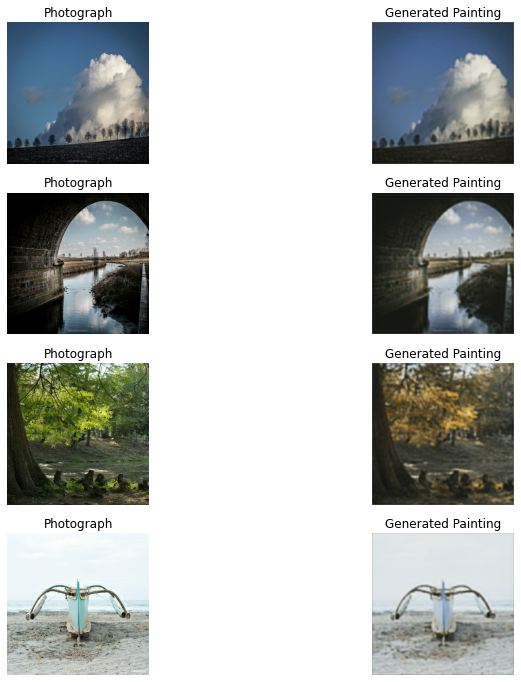

15/15 [==============================] - 1747s 117s/step - Monet_Disc_AVG_Loss: 0.0044 - Monet_Disc_BCE_Loss: 0.3645 - Monet_Disc_Loss: 0.1845 - Monet_Gen_AVG_Loss: 1.0002 - Monet_Gen_BCE_Loss: 1.3368 - Monet_Gen_Loss: 1.1685 - Photo_Disc_Loss: 0.0054 - Photo_Gen_Loss: 0.9211
Epoch 20/20
15/15 [==============================] - ETA: 0s - Monet_Disc_AVG_Loss: 0.0055 - Monet_Disc_BCE_Loss: 0.3759 - Monet_Disc_Loss: 0.1907 - Monet_Gen_AVG_Loss: 0.9698 - Monet_Gen_BCE_Loss: 1.3335 - Monet_Gen_Loss: 1.1517 - Photo_Disc_Loss: 0.0104 - Photo_Gen_Loss: 0.9113  

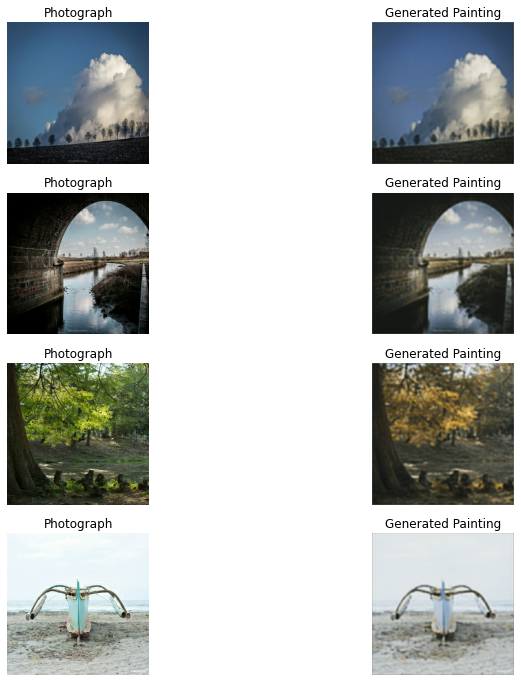

15/15 [==============================] - 1801s 120s/step - Monet_Disc_AVG_Loss: 0.0054 - Monet_Disc_BCE_Loss: 0.3791 - Monet_Disc_Loss: 0.1922 - Monet_Gen_AVG_Loss: 0.9693 - Monet_Gen_BCE_Loss: 1.3371 - Monet_Gen_Loss: 1.1532 - Photo_Disc_Loss: 0.0099 - Photo_Gen_Loss: 0.9114


In [54]:
# Training for 20 epochs taking 15 steps per epoch

cycle_gan_model.fit(final_dataset,steps_per_epoch=15, epochs=20, callbacks=[monitor])

In [56]:
# Calculating FID Score

FID(fid_photo_ds,monet_generator)

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[16.301132]], dtype=float32)>

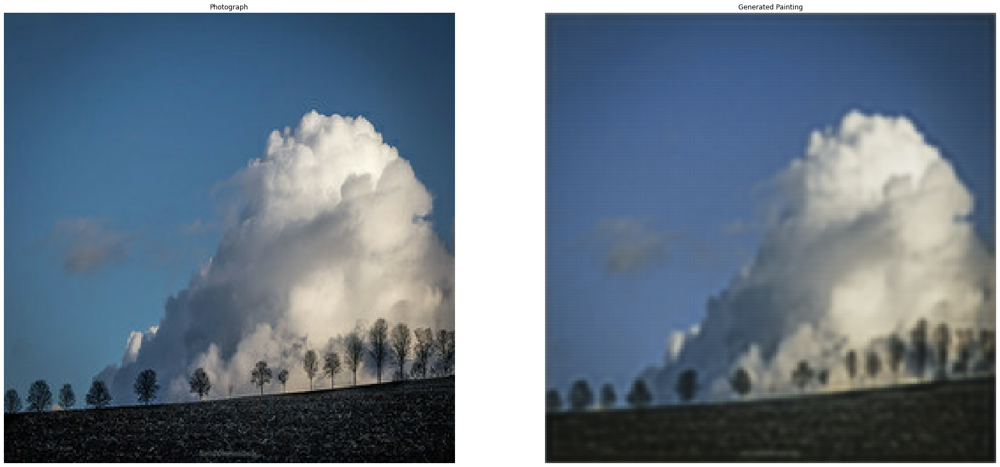

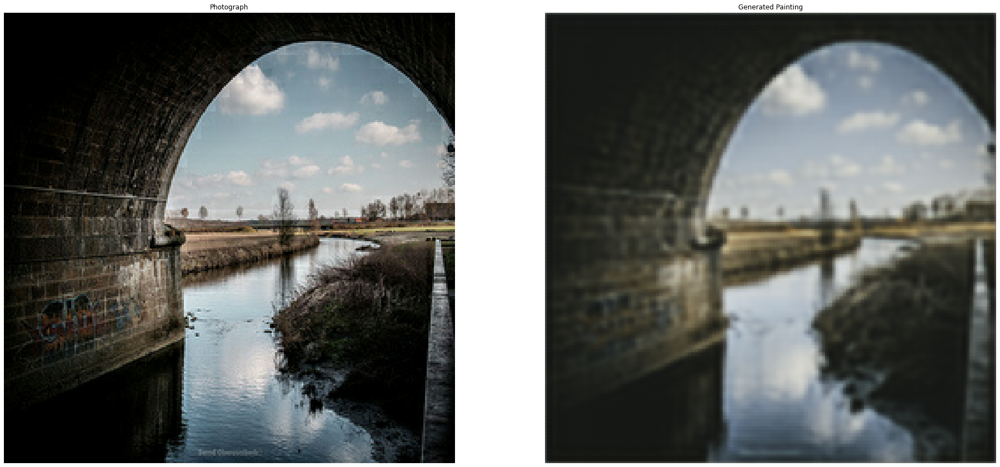

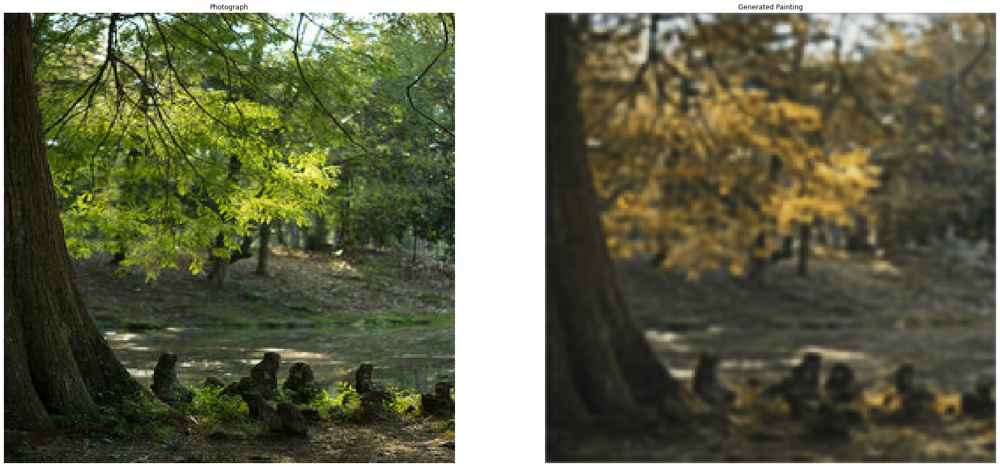

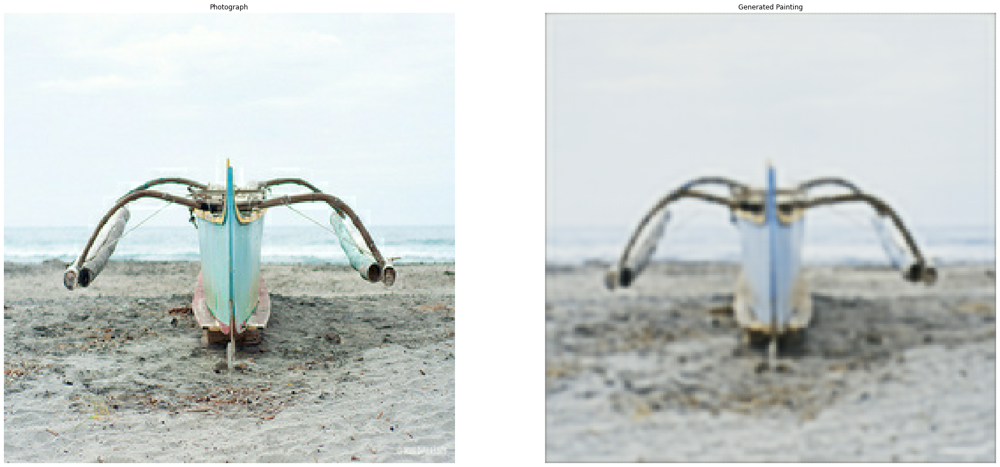

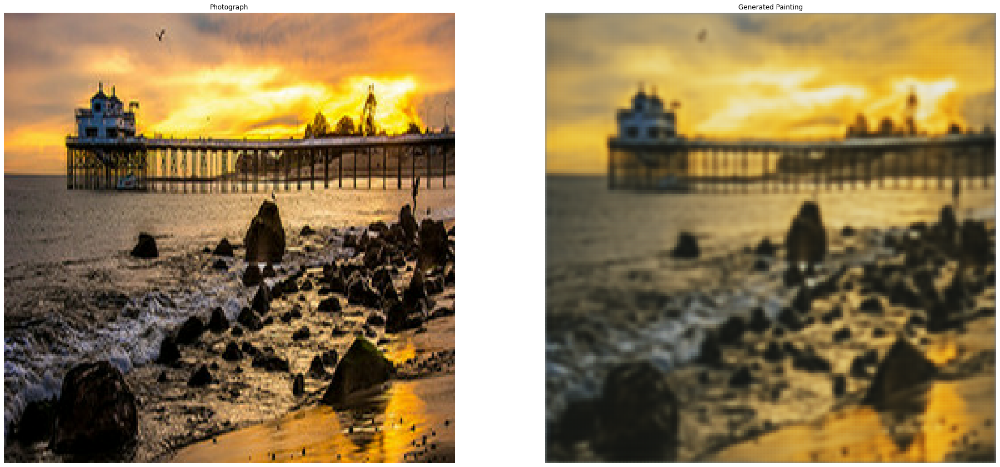

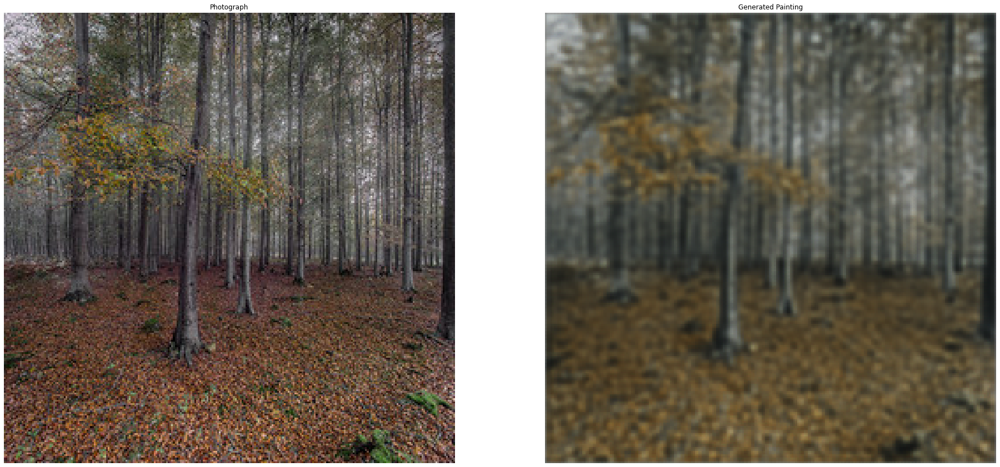

In [70]:
ds_iter = iter(photo_ds)
for n_sample in range(6):
        example_sample = next(ds_iter)
        generated_sample = monet_generator(example_sample)
        
        f = plt.figure(figsize=(32, 32))
        
        plt.subplot(121)
        plt.title('Photograph')
        plt.imshow(example_sample[0] * 0.5 + 0.5)
        plt.axis('off')
        
        plt.subplot(122)
        plt.title('Generated Painting')
        plt.imshow(generated_sample[0] * 0.5 + 0.5)
        plt.axis('off')
        plt.show()

In [71]:
# Saving weights

cycle_gan_model.p_gen.save_weights("p_gen_weights_best.h5")
monet_generator.save_weights("monet_generator_best.h5")

cycle_gan_model.p_disc.save_weights("p_disc_weights_best.h5")
cycle_gan_model.m_disc.save_weights("m_disc_weights_best.h5")

As the model has over 50 million parameter, the training takes quite some time and the file size becomes larger with every single epoch, and actually so large that the notebook exceeds 25 megabytes (which is the limit in saving to GitHub) quite easily. In the research paper, the models were trained for 200 epochs, but here we trained only 20 with 15 steps in each epoch. If we train the model more, the FID score becomes a bit better, with 40 epochs reaching to around 13. The blurred output becomes clearer and resembles more and more to the photographic image after each epoch. However, as we can see from the training losses, the discriminators seem to be doing a pretty good job in evaluating the images, but the generators on the other hand, don't seem to be learning, instead the losses, especially with the one generating the paintings from the images, seem to be growing larger and larger. Perhaps the generator might thus be a bit too complicately designed to do it's job. For this reason, we will try another model that follows more the one suggested in the CycleGAN research paper that has a generator that is based on the Residual Network - ResNet - that was originally proposed by Kaiming He, et al., (2016), "Deep Residual Learning for Image Recognition". This will be implemented on the second Jupyter Notebook 'CycleGAN'.